In [1]:
%load_ext autoreload
%autoreload 2

import io
import os
import sys
import IPython.display
import PIL.Image
from pprint import pformat
import matplotlib.pyplot as plt
from pathlib import Path

import numpy as np

root_dir = Path('../..').resolve()

if str(root_dir) not in sys.path: 
    sys.path.append(str(root_dir))
taming_dir = str(sys.path.append(str(root_dir / 'taming-transformers')))
if taming_dir not in sys.path:
    sys.path.append(taming_dir)

In [2]:
import yaml
import torch
torch.set_grad_enabled(False)
from omegaconf import OmegaConf
from taming.models.vqgan import VQModel, GumbelVQ

def load_config(config_path, display=False):
    config = OmegaConf.load(config_path)
    if display:
        print(yaml.dump(OmegaConf.to_container(config)))
    return config

def load_vqgan(config, ckpt_path=None, is_gumbel=False):
    if is_gumbel:
        model = GumbelVQ(**config.model.params)
    else:
        model = VQModel(**config.model.params)
    if ckpt_path is not None:
        sd = torch.load(ckpt_path, map_location="cpu")["state_dict"]
        missing, unexpected = model.load_state_dict(sd, strict=False)
    return model.eval()

def preprocess_vqgan(x):
    x = 2.*x - 1.
    return x

def custom_to_pil(x):
    x = x.detach().cpu()
    x = torch.clamp(x, -1., 1.)
    x = (x + 1.)/2.
    x = x.permute(1,2,0).numpy()
    x = (255*x).astype(np.uint8)
    x = Image.fromarray(x)
    if not x.mode == "RGB":
        x = x.convert("RGB")
    return x

def reconstruct_with_vqgan(x, model):
    # could also use model(x) for reconstruction but use explicit encoding and decoding here
    quant, pre_quant, _, [_, _, indices] = model.encode(x)
    xrec = model.decode_code(indices)
    return xrec, quant, pre_quant, indices

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

config1024 = load_config(root_dir / "logs/vqgan_imagenet_f16_1024/configs/model.yaml", display=False)
model1024 = load_vqgan(config1024, ckpt_path=root_dir / "logs/vqgan_imagenet_f16_1024/checkpoints/last.ckpt").to(device)

config16384 = load_config(root_dir / "logs/vqgan_imagenet_f16_16384/configs/model.yaml", display=False)
model16384 = load_vqgan(config16384, ckpt_path=root_dir / "logs/vqgan_imagenet_f16_16384/checkpoints/last.ckpt").to(device)

config32x32 = load_config(root_dir / "logs/vqgan_gumbel_f8/configs/model.yaml", display=False)
model32x32 = load_vqgan(config32x32, ckpt_path=root_dir / "logs/vqgan_gumbel_f8/checkpoints/last.ckpt", is_gumbel=True).to(device)

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to C:\Users\Cefir/.cache\torch\hub\checkpoints\vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips\vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips\vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Working with z of shape (1, 256, 32, 32) = 262144 dimensions.


In [4]:
import io
import os, sys
import requests
import PIL
from PIL import Image
from PIL import ImageDraw, ImageFont
import numpy as np

import torch
import torch.nn.functional as F
import torchvision.transforms as T
import torchvision.transforms.functional as TF

from dall_e          import map_pixels, unmap_pixels, load_model
from IPython.display import display, display_markdown

#font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSans-BoldItalic.ttf", 22)

def download_image(url):
    resp = requests.get(url)
    resp.raise_for_status()
    return PIL.Image.open(io.BytesIO(resp.content))


def preprocess(img, target_image_size=256, map_dalle=True):
    s = min(img.size)
    
    if s < target_image_size:
        raise ValueError(f'min dim for image {s} < {target_image_size}')
        
    r = target_image_size / s
    s = (round(r * img.size[1]), round(r * img.size[0]))
    img = TF.resize(img, s, interpolation=PIL.Image.LANCZOS)
    img = TF.center_crop(img, output_size=2 * [target_image_size])
    img = torch.unsqueeze(T.ToTensor()(img), 0)
    if map_dalle: 
        img = map_pixels(img)
    return img


def reconstruct_with_dalle(x, encoder, decoder, do_preprocess=False):
    # takes in tensor (or optionally, a PIL image) and returns a PIL image
    if do_preprocess:
        x = preprocess(x)
    z_logits = encoder(x)
    indices = torch.argmax(z_logits, axis=1)

    z = F.one_hot(indices, num_classes=encoder.vocab_size).permute(0, 3, 1, 2).float()
    
    x_stats = decoder(z).float()
    x_rec = unmap_pixels(torch.sigmoid(x_stats[:, :3]))
    x_rec = T.ToPILImage(mode='RGB')(x_rec[0])

    return x_rec, z, z_logits, indices


def stack_reconstructions(input, x0, x1, x2, x3):
    assert input.size == x1.size == x2.size == x3.size
    w, h = input.size[0], input.size[1]
    img = Image.new("RGB", (5*w, h))
    img.paste(input, (0,0))
    img.paste(x0, (1*w,0))
    img.paste(x1, (2*w,0))
    img.paste(x2, (3*w,0))
    img.paste(x3, (4*w,0))
    #for i, title in enumerate(titles):
    #    ImageDraw.Draw(img).text((i*w, 0), f'{title}', (255, 255, 255), font=font) # coordinates, text, color, font
    return img

In [5]:
# For faster load times, download these files locally and use the local paths instead.
encoder_dalle = load_model("https://cdn.openai.com/dall-e/encoder.pkl", device)
decoder_dalle = load_model("https://cdn.openai.com/dall-e/decoder.pkl", device)

In [6]:
import h5py
from pathlib import Path
from ipywidgets import interact
from torchvision import transforms

def reconstruction_pipeline(img, size=224):
    x_dalle = preprocess(img, target_image_size=size, map_dalle=True)
    x_vqgan = preprocess(img, target_image_size=size, map_dalle=False)
    x_dalle = x_dalle.to(device)
    x_vqgan = x_vqgan.to(device)

    x0, quant0, pre_quant0, i0 = reconstruct_with_vqgan(preprocess_vqgan(x_vqgan), model32x32)
    x1, quant1, pre_quant1, i1 = reconstruct_with_vqgan(preprocess_vqgan(x_vqgan), model16384)
    x2, quant2, pre_quant2, i2  = reconstruct_with_vqgan(preprocess_vqgan(x_vqgan), model1024)
    x3, quant3, pre_quant3, i3  = reconstruct_with_dalle(x_dalle, encoder_dalle, decoder_dalle)
    img = stack_reconstructions(custom_to_pil(preprocess_vqgan(x_vqgan[0])), 
                                x3, 
                                custom_to_pil(x0[0]), 
                                custom_to_pil(x1[0]), 
                                custom_to_pil(x2[0]),)
    return img, (quant0, quant1, quant2, quant3), (pre_quant0, pre_quant1, pre_quant2, pre_quant3), (i0, i1, i2, i3)


root = 'X:\\Datasets\\Deep-Image-Reconstruction'
stimulus_images = h5py.File(Path(root) / "derivatives" / "stimulus_images.hdf5", "r")


@interact(stimulus_id=list(stimulus_images.keys()))
def show(stimulus_id):
    image_data = stimulus_images[stimulus_id]['data'][:]
    image = Image.fromarray(image_data)
    
    size = 224
    image = transforms.Resize(size)(image)
    
    out, quant, pre_quant, indices = reconstruction_pipeline(image, size=size)

    plt.figure(figsize=(16, 16))
    plt.imshow(out)

interactive(children=(Dropdown(description='stimulus_id', options=('11978233.016933', '11978233.018962', '1197…

In [ ]:
from torchvision import transforms

derivatives_path = Path('X:\\Datasets\\Deep-Image-Reconstruction\\derivatives\\')
from tqdm.notebook import tqdm

break

with h5py.File(derivatives_path / f"vqgan-features.hdf5", "a") as f:
    for stimulus_id, stimulus_image in tqdm(list(stimulus_images.items())):
        image_data = stimulus_image['data'][:]
        image = Image.fromarray(image_data)
        
        size = 224
        image = transforms.Resize(size)(image)
        
        out, quant, pre_quant, indices = reconstruction_pipeline(image, size=size)
        
        names = ('vqgan-f8-8192', 'vqgan-f16-16384', 'vqgan-f16-1024', 'dall-e',)
        features = {}
        features.update({f'{name}-indices': i.flatten() for name, i in zip(names, indices)})
        features.update({f'{name}-pre_quant': l[0] for name, l in zip(names, pre_quant)})
        features.update({f'{name}-quant': l[0] for name, l in zip(names, quant)})

        if stimulus_id not in f:
            stimulus = f.create_group(stimulus_id)
        else:
            stimulus = f[stimulus_id]

        for node_name, feature in features.items():
            feature = feature.cpu()
            if node_name in stimulus:
                stimulus[node_name][:] = feature
            else:
                stimulus[node_name] = feature

In [ ]:
N, C, H, W = Y_test.shape

@interact(n=(0, N-1), c=(0, C-1))
def show(n, c):
    y = Y_test[n, c]
    y_pred = Y_test_pred[n, c]
    img = np.concatenate([y, y_pred], axis=1)
    plt.imshow(img)

In [ ]:
N, C, H, W = Y_test.shape

@interact(n=(0, N-1), h=(0, H-1), w=(0, W-1))
def show(n, h, w):
    y = Y_test[n, :, h, w]
    y_pred = Y_test_pred[n, :, h, w]
    plt.figure(figsize=(12, 8))
    plt.plot(np.arange(C), y, label='y')
    plt.plot(np.arange(C), y_pred, label='y_pred')
    plt.legend()

In [7]:
from pathlib import Path

from research.metrics.metrics import embedding_distance

stimulus_ids = ['1443537.022563', '1621127.019020', '1677366.018182', '1846331.017038', '1858441.011077', '1943899.024131', '1976957.013223', '2071294.046212', '2128385.020264', '2139199.010398', '2190790.015121', '2274259.024319', '2416519.012793', '2437136.012836', '2437971.005013', '2690373.007713', '2797295.015411', '2824058.018729', '2882301.014188', '2916179.024850', '2950256.022949', '2951358.023759', '3064758.038750', '3122295.031279', '3124170.013920', '3237416.058334', '3272010.011001', '3345837.012501', '3379051.008496', '3452741.024622', '3455488.028622', '3482252.022530', '3495258.009895', '3584254.005040', '3626115.019498', '3710193.022225', '3716966.028524', '3761084.043533', '3767745.000109', '3941684.021672', '3954393.010038', '4210120.009062', '4252077.010859', '4254777.016338', '4297750.025624', '4387400.016693', '4507155.021299', '4533802.019479', '4554684.053399', '4572121.003262']

subject = 'sub-03'
version = '1-0'
code_name = 'pca'
feature_name = 'pre_quant'

derivatives_path = Path('X:\\Datasets\\Deep-Image-Reconstruction\\derivatives\\')
decoded_features_path = derivatives_path / 'decoded_features' / 'vqgan' / f'vqgan-f16-1024-{feature_name}' / subject

Y_test_pred = np.load(decoded_features_path / f'natural_test__{code_name}__v{version}.npy')
Y_test = np.load(derivatives_path / 'decoded_features' / 'vqgan__vqgan-f16-1024-latent__sub-03__test.npy')

if code_name == 'embedding':
    embedding = torch.from_numpy(np.load(decoded_features_path / f'{code_name}__v{version}.npy')).cuda()

#Y_test_pred = Y_test_pred[:, 0]
#Y_test_pred = (Y_test_pred) / Y_test_pred.std(axis=(1,), keepdims=True) #* Y_test.std(axis=(1,), keepdims=True) 

print(Y_test.shape, Y_test_pred.shape)
print(Y_test.mean(), Y_test.std())
print(Y_test_pred.mean(), Y_test_pred.std())

index_map = {stim_id: i for i, stim_id in enumerate(stimulus_ids)}

def reconstruction_pipeline(image, y_pred, size=224, include_encoding=True):
    x = preprocess(image, target_image_size=size, map_dalle=False)
    x = x.to(device)
    
    x0, _, _, _ = reconstruct_with_vqgan(preprocess_vqgan(x), model1024)
    x0 = torch.clip(x0 * 0.5 + 0.5, 0., 1.)
    
    if feature_name == 'indices' or code_name == 'classifier':
        if code_name == 'embedding':
            if len(y_pred.shape) == 5:
                mu = y_pred[:, 0]
                std = y_pred[:, 1]
                eps = torch.randn_like(mu)
                y_pred = eps * std + mu
            
            y_pred = -embedding_distance(y_pred, embedding)

        y_pred = y_pred.argmax(dim=1)
        x1 = model1024.decode_code(y_pred)
        
    else:
        x1 = model1024.decode(model1024.quantize(y_pred)[0])
    x1 = torch.clip(x1 * 0.5 + 0.5, 0., 1.)
    
    x_out = torch.cat([x, x0, x1] if include_encoding else [x, x1], dim=2)[0]
    x_out = torch.moveaxis(x_out, 0, -1)
    x_out = x_out.cpu().numpy()
    return x_out

@interact(stimulus_id=stimulus_ids)
def show(stimulus_id):
    i = index_map[stimulus_id]
    
    image_data = stimulus_images[stimulus_id]['data'][:]
    image = Image.fromarray(image_data)
    y_pred = torch.from_numpy(Y_test_pred[i][None]).float().to(device) 
    
    size = 224
    image = transforms.Resize(size)(image)
    
    x_out = reconstruction_pipeline(image, y_pred)
    
    plt.figure(figsize=(12, 12))
    plt.imshow(x_out)

(50, 256, 14, 14) (50, 256, 14, 14)
0.0018161791 0.8103342
0.004845731 0.39764458


interactive(children=(Dropdown(description='stimulus_id', options=('1443537.022563', '1621127.019020', '167736…

In [ ]:
from pathlib import Path

out_path = Path('X:\\Datasets\\Deep-Image-Reconstruction\\derivatives\\')
embedding = model1024.quantize.embedding
np.save(out_path / 'vqgan-model1024-embedding-weight.npy', embedding.weight.data.cpu().numpy())

In [ ]:
Y = F.softmax(torch.from_numpy(Y_test_pred), dim=1)
Y.max(dim=1)

In [47]:
Y_test_pred_indices = torch.stack([
    model1024.quantize(torch.from_numpy(y[None]).cuda())[2][2]
    for y in list(Y_test_pred)
])

Y_test_indices = torch.stack([
    model1024.quantize(torch.from_numpy(y[None]).cuda())[2][2]
    for y in list(Y_test)
])

In [ ]:
ids, counts = torch.unique(Y_test_pred_indices, return_counts=True)
print(ids, counts)

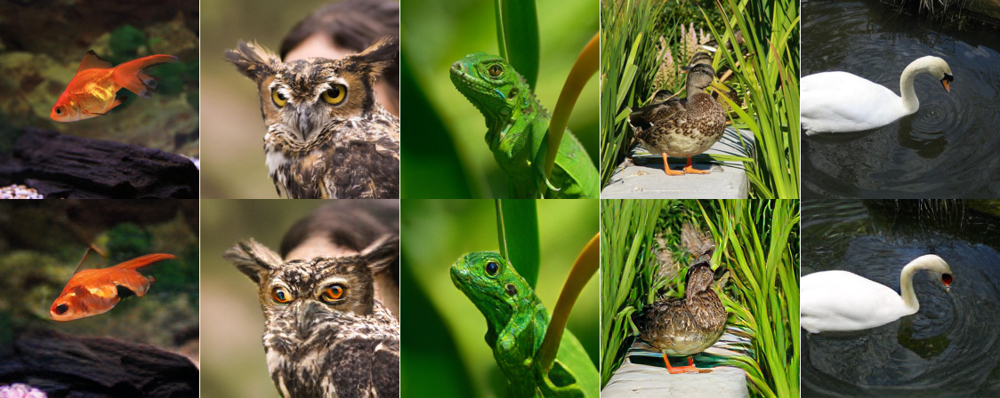

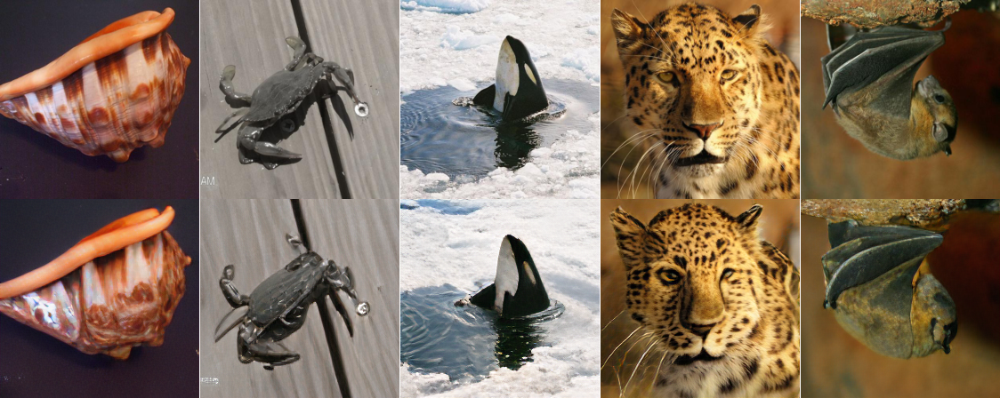

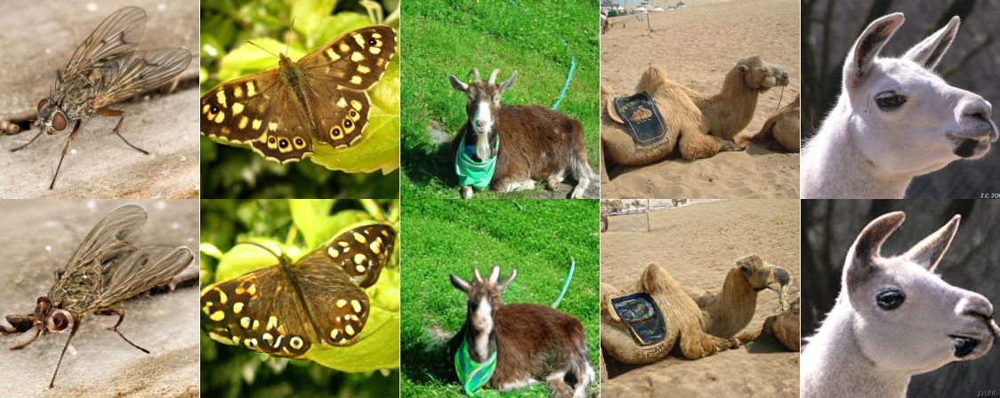

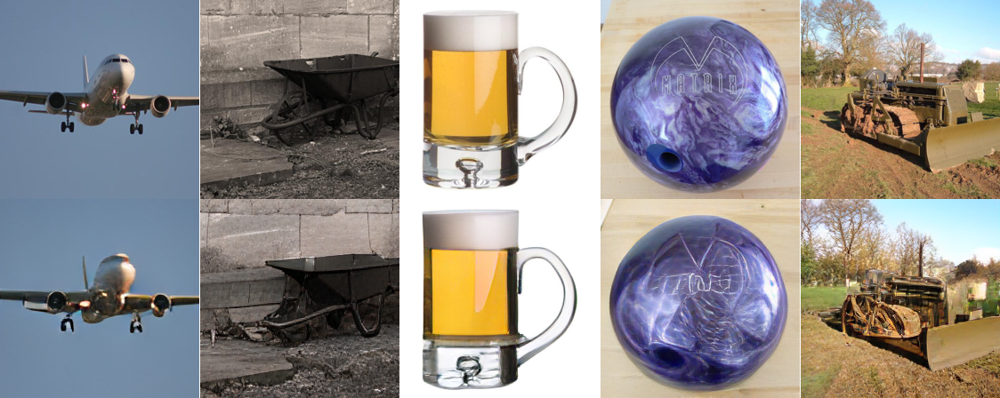

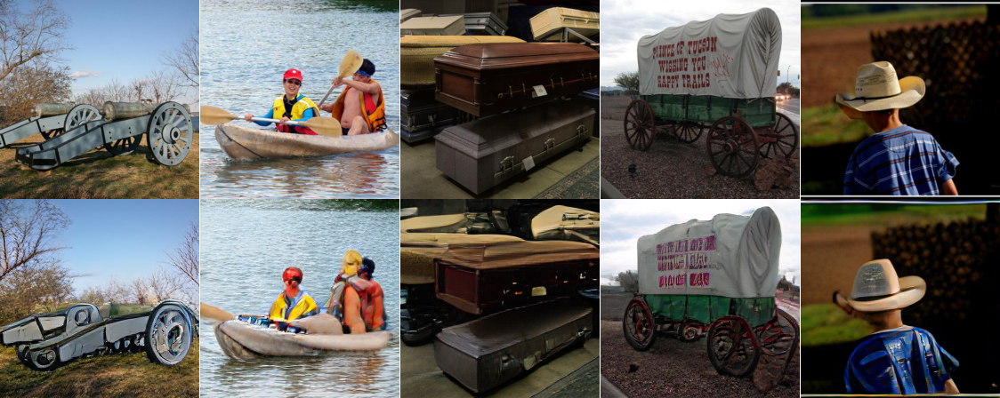

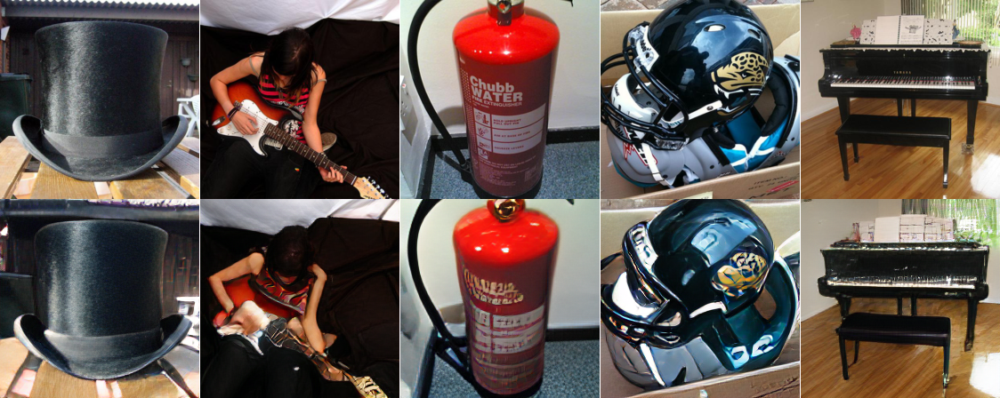

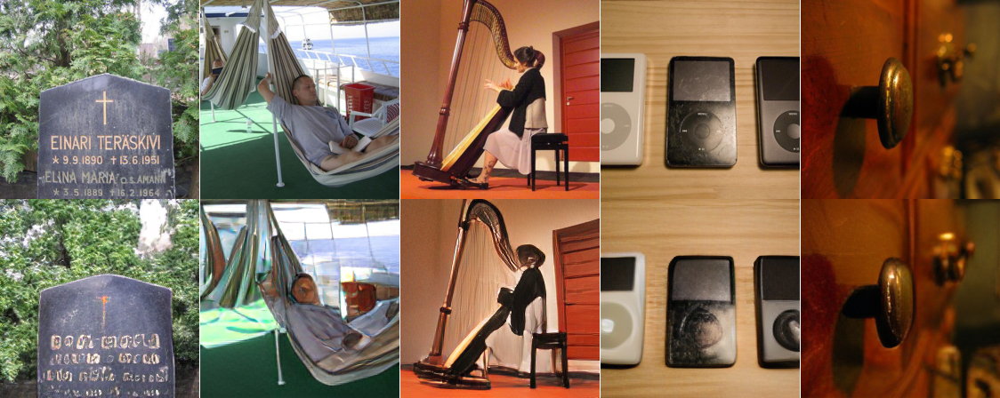

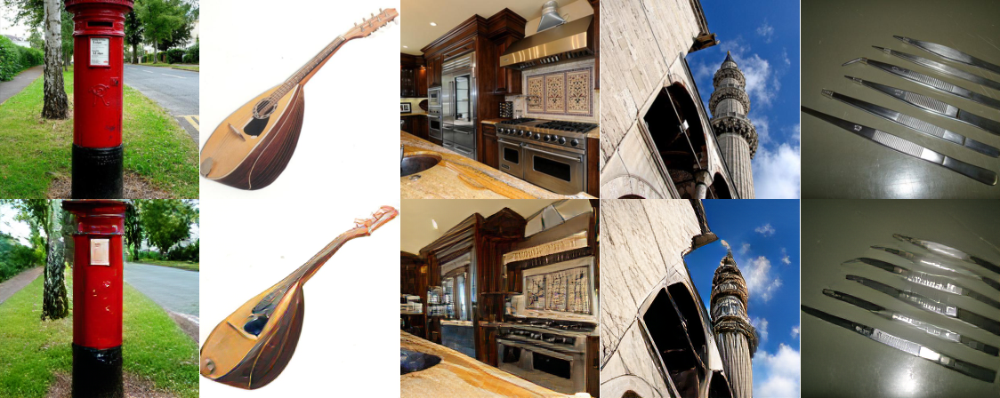

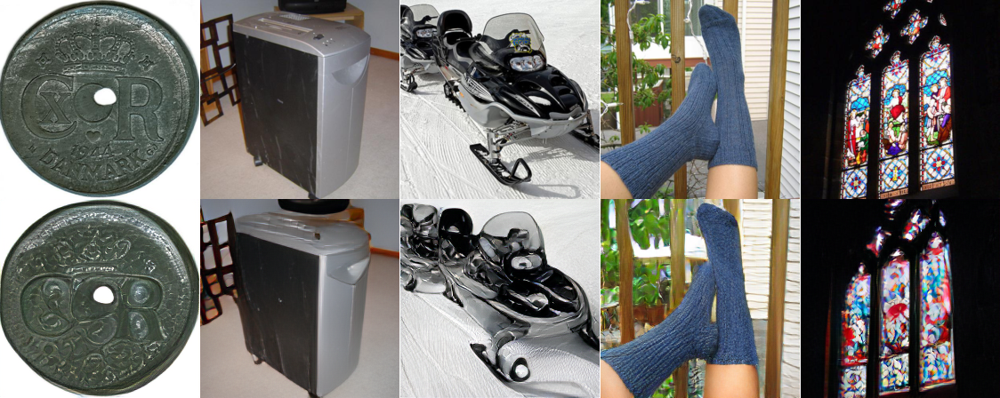

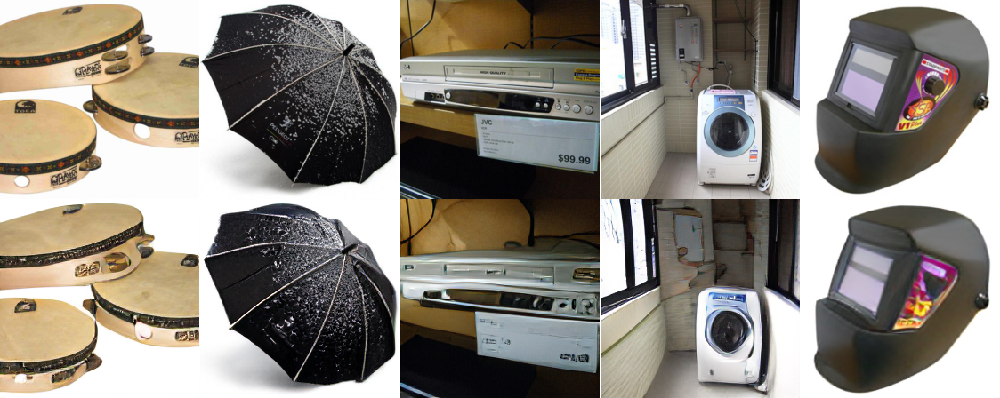

In [11]:
from pathlib import Path
from PIL import Image
from research.scripts.bigbigan import imshow, imgrid, image_to_uint8

x_all = []
for i, stimulus_id in enumerate(stimulus_ids):
    image_data = stimulus_images[stimulus_id]['data'][:]
    image = Image.fromarray(image_data)
    y_pred = torch.from_numpy(Y_test[i][None]).float().to(device)
    
    size = 224
    image = transforms.Resize(size)(image)
    
    x_out = reconstruction_pipeline(image, y_pred, include_encoding=False)
    x_all.append(x_out)
x_all = np.stack(x_all)

out_folder = Path('X:\\Datasets\\Deep-Image-Reconstruction\\derivatives\\results\\vqgan')

cols = 5
splits = 10

for i, x_group in enumerate(np.split(x_all, splits)):
    #x = np.concatenate([elem for elem in list(x_group)], axis=1)
    img = imgrid(image_to_uint8(x_group * 2. - 1.), cols=cols)
    
    #out_dir = out_folder / feature_name / code_name / subject 
    out_dir = out_folder / 'model_reconstructions'
    out_dir.mkdir(exist_ok=True, parents=True)
    #Image.fromarray(img).save(out_dir / f'vqgan__{feature_name}__{code_name}__{subject}__{version}__{i*splits}-{(i+1)*splits}.png')
    Image.fromarray(img).save(out_dir / f'vqgan__model_reconstructions__{i*splits}-{(i+1)*splits}.png')
    #image = Image.fromarray(np.uint8(x * 255))
    imshow(img)

In [10]:
out_dir

WindowsPath('X:/Datasets/Deep-Image-Reconstruction/derivatives/results/vqgan/pre_quant/pca/sub-03')